## Wymagane biblioteki

In [2]:
import os

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.utils as vutils
from PIL import Image

import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from IPython.display import HTML

In [3]:
# Set random seed for reproducibility
manualSeed = 999
np.random.seed(manualSeed)
torch.manual_seed(manualSeed)

print("Random Seed: ", manualSeed)

Random Seed:  999


## Dane - wczytanie i konwersja obrazów do wektorów


In [4]:
class Dataset(Dataset):
    
    def __init__(self, img_dir):
        path_list = os.listdir(img_dir) #images names
        abspath = os.path.abspath(img_dir) #absolute path of images

        self.img_list = [os.path.join(abspath, path) for path in path_list] #full path

        #set of transformations
        self.transform = transforms.Compose([
            transforms.Resize(64),
            transforms.CenterCrop(64),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]), #normalize [-1, 1]
        ])


    def __len__(self):
        return len(self.img_list)


    def __getitem__(self, index):
        path = self.img_list[index]
        img = Image.open(path).convert('RGB') #image size (256, 256)
        return self.transform(img)
        #return img

In [5]:
db = Dataset('monet_jpg')

In [6]:
db[0].shape

torch.Size([3, 64, 64])

## Generator

In [7]:
class Generator(nn.Module):
    
    def __init__(self, noise_size, img_dim=64): #img_dim=64
        super(Generator, self).__init__()

        self.main = nn.Sequential(
            nn.ConvTranspose2d(in_channels=noise_size, out_channels=img_dim * 8, kernel_size=4, stride=1, padding=0, bias=False), 
            nn.BatchNorm2d(img_dim * 8),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=img_dim * 8, out_channels=img_dim * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(img_dim * 4),
            nn.ReLU(True),
           
            nn.ConvTranspose2d(in_channels=img_dim * 4, out_channels=img_dim * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(img_dim * 2),
            nn.ReLU(True),
           
            nn.ConvTranspose2d(in_channels=img_dim * 2, out_channels=img_dim, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(img_dim),
            nn.ReLU(True),
          
            nn.ConvTranspose2d(in_channels=img_dim, out_channels=3, kernel_size=4, stride=2, padding=1, bias=False), #out_channels RGB
            nn.Tanh()
        )


    def forward(self, x):
        x = x.view(x.size(0), x.size(1), 1, 1) 
        return self.main(x)

In [8]:
Generator(100, 64)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

## Dyskryminator

In [9]:
class Discriminator(nn.Module):

    def __init__(self, img_dim=64):
        super(Discriminator, self).__init__()

        self.main = nn.Sequential(
            nn.Conv2d(3, img_dim, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
   
            nn.Conv2d(img_dim, img_dim * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(img_dim * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(img_dim * 2, img_dim * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(img_dim * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(img_dim * 4, img_dim * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(img_dim * 8),
            nn.LeakyReLU(0.2, inplace=True),
          
            nn.Conv2d(img_dim * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )


    def forward(self, x):
        return self.main(x)

## DCGAN 

In [10]:
class DCGAN:

    def __init__(self, noise_size, img_dim):
        self.noise_size = noise_size

        self.D = Discriminator(img_dim)
        self.G = Generator(noise_size, img_dim)

        self.device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
    
        self.D.to(self.device)
        self.G.to(self.device)

        self.D.apply(self.weights_init)
        self.G.apply(self.weights_init)

        
    def weights_init(self, m):
        classname = m.__class__.__name__
        if classname.find('Conv') != -1:
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        elif classname.find('BatchNorm') != -1:
            nn.init.normal_(m.weight.data, 1.0, 0.02)
            nn.init.constant_(m.bias.data, 0)

            
    def describe(self):
        print('Discriminator')
        print(self.D)

        print('\nGenerator')
        print(self.G)

    
    def __calculate_loss(self, output, labels):
        criterion = nn.BCELoss()
        return criterion(output.squeeze(), labels)


    def real_loss(self, D_out):
        batch_size = D_out.size(0)
        labels = torch.ones(batch_size).to(self.device)*0.8

        return self.__calculate_loss(D_out, labels) 


    def fake_loss(self, D_out):
        batch_size = D_out.size(0)
        labels = torch.ones(batch_size).to(self.device)*0.1
 
        return self.__calculate_loss(D_out, labels)


    def noise(self, size):
        z = np.random.uniform(-1, 1, size=size)
        return torch.from_numpy(z).float().to(self.device)


    def train_generator(self, g_optim, size):
        g_optim.zero_grad()

        z = self.noise(size)
        fake_images = self.G(z)
        
        d_fake = self.D(fake_images)

        g_loss = self.real_loss(d_fake)

        g_loss.backward()
        g_optim.step()

        return g_loss.item()

    
    def train_discriminator(self, d_optim, real_images, size):
        d_optim.zero_grad()

        d_real = self.D(real_images.to(self.device)).view(-1)
        d_real_loss = self.real_loss(d_real)

        z = self.noise(size)
        fake_images = self.G(z)
      
        d_fake = self.D(fake_images)
        d_fake_loss = self.fake_loss(d_fake)

        d_loss = d_real_loss + d_fake_loss

        d_loss.backward()
        d_optim.step()

        return d_loss.item()


    def train(self, num_epochs, d_optim, g_optim, data_loader, z_size, sample_size, print_every=500):
        samples, losses = [], []

        z = self.noise((sample_size, z_size))

        self.D.train()
        self.G.train()

        print(f'Running on {self.device}')
        for epoch in range(num_epochs):
            for i, real_images in enumerate(data_loader):                    
                batch_size = real_images.size(0)

                d_loss = self.train_discriminator(d_optim, real_images, (sample_size, z_size))
                g_loss = self.train_generator(g_optim, (sample_size, z_size))

                if i % print_every == 0:
                    print('Epoch [{:5d}/{:5d}] | d_loss {:6.4f} | g_loss {:6.4f}'.format(
                        epoch+1,
                        num_epochs,
                        d_loss,
                        g_loss
                    ))

            losses.append( (d_loss, g_loss) )

            self.G.eval()
            samples.append( self.G(z) )
            self.G.train()

        with open('DCGAN_Sample_Output.pkl', 'wb') as f:
            pkl.dump(samples, f)

        return samples, losses

## TRENING

In [11]:
# Dataset
monet_dataset = Dataset('monet_jpg') #data_dir
data_loader = DataLoader(monet_dataset, batch_size=16, shuffle=True)

noise_size = 128
img_size = 64

# Model
dcgan_model = DCGAN(noise_size, img_size)

# Oprimizer
lr = 0.0002
beta1=0.5
beta2=0.999

d_optimizer = optim.Adam(dcgan_model.D.parameters(), lr, [beta1, beta2])
g_optimizer = optim.Adam(dcgan_model.G.parameters(), lr, [beta1, beta2])

# train
EPOCHS = 400
sample_size = 16     # sample size of images generated in each epoch
sample_result, losses_history = dcgan_model.train(EPOCHS, d_optimizer, g_optimizer, data_loader, noise_size, 16, print_every=1000)

Running on cuda
Epoch [    1/  400] | d_loss 2.4947 | g_loss 3.3419
Epoch [    2/  400] | d_loss 1.2845 | g_loss 5.9690
Epoch [    3/  400] | d_loss 1.7266 | g_loss 11.4884
Epoch [    4/  400] | d_loss 2.3114 | g_loss 14.1118
Epoch [    5/  400] | d_loss 1.7625 | g_loss 7.1500
Epoch [    6/  400] | d_loss 0.9947 | g_loss 2.4009
Epoch [    7/  400] | d_loss 1.1480 | g_loss 2.7366
Epoch [    8/  400] | d_loss 1.3059 | g_loss 6.7819
Epoch [    9/  400] | d_loss 0.9743 | g_loss 2.6180
Epoch [   10/  400] | d_loss 0.9900 | g_loss 3.8702
Epoch [   11/  400] | d_loss 0.9463 | g_loss 1.4496
Epoch [   12/  400] | d_loss 0.9583 | g_loss 1.9178
Epoch [   13/  400] | d_loss 1.1582 | g_loss 2.2156
Epoch [   14/  400] | d_loss 1.0871 | g_loss 1.9686
Epoch [   15/  400] | d_loss 0.9868 | g_loss 1.8313
Epoch [   16/  400] | d_loss 0.9240 | g_loss 2.0837
Epoch [   17/  400] | d_loss 1.0059 | g_loss 3.1411
Epoch [   18/  400] | d_loss 0.9445 | g_loss 2.2541
Epoch [   19/  400] | d_loss 1.0710 | g_loss 4

In [12]:
for i, real_images in enumerate(data_loader):                    
  print(real_images.size(0))

16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
16
12


## Wystawa

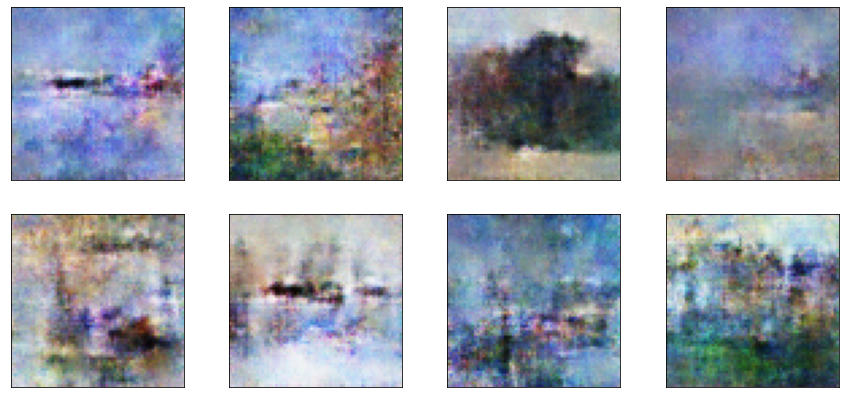

In [13]:
fig, axes = plt.subplots(figsize=(15,7), nrows=2, ncols=4, sharey=True, sharex=True)
for ax, img in zip(axes.flatten(), sample_result[EPOCHS-1]):
    _, w, h = img.size()
     
    img = img.detach().cpu().numpy()

    img = np.transpose(img, (1, 2, 0))
    
    img = ((img +1)*255 / (2)).astype(np.uint8)

    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    
    im = ax.imshow(img.reshape((w,h,3)))

plt.show()

### Straty w trakcie treningu

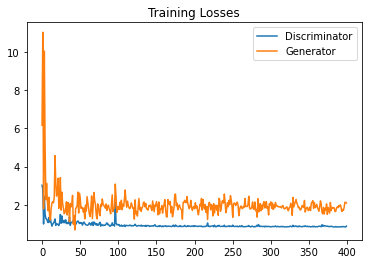

In [14]:
fig, ax = plt.subplots()
losses = np.array(losses_history)
plt.plot(losses.T[0], label='Discriminator')
plt.plot(losses.T[1], label='Generator')
plt.title("Training Losses")
plt.legend()
plt.show()

### Postęp generatora w trakcie treningu

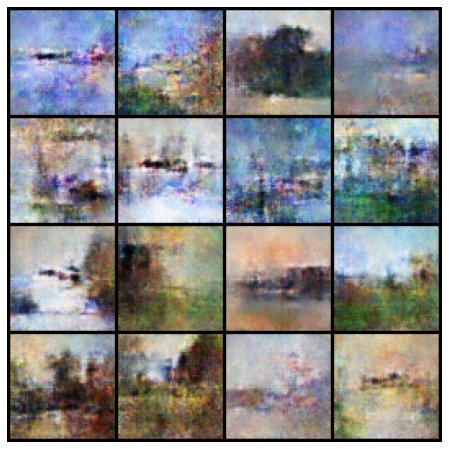

In [15]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
img_list = []

for p in [*range(0, EPOCHS-1, 20), EPOCHS-1]:
    with torch.no_grad():
        temp = sample_result[p].detach().cpu()
    img_list.append(vutils.make_grid(temp, nrow=4,padding=2,normalize=True))
                        
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]

ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())


Zapisywanie jako gif.

In [16]:
f = r"C:\Users\Ola\Desktop\WTUM_13_2022-main\animation.gif" 
writergif = animation.PillowWriter(fps=1) 
ani.save(f, writer=writergif)

## Porównanie wyników z prawdziwymi obrazami

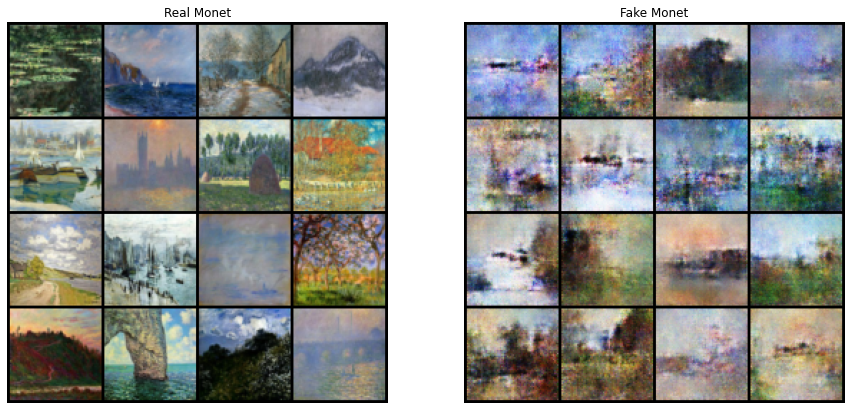

In [17]:
select_few = [db[i] for i in np.random.randint(len(db), size=16)]
# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Monet")
plt.imshow(np.transpose(vutils.make_grid(select_few, nrow =4, padding=2, normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Monet")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()